![](https://wherobots.com/wp-content/uploads/2023/12/Inline-Blue_Black_onWhite.png)
# <span style="color: #7b73e2;">WherobotsAI Raster Inference - Predicting Bounding Boxes from an LLM-based Text Query</span>


#### This example demonstrates an Open Vocabulary object Detection model called OWLv2 from Google Deepmind. We'll use this model in **Raster Inference** to identify <span style="color: #7b73e2;">**marine infrastructure**</span> (offshore wind farms and platforms) in satellite imagery.

We will use this **machine-learning model** on imagery from the **European Space Agency’s Sentinel-2 satellites**.

---
<div style="display: flex; justify-content: center; align-items: center; gap: 20px;">
    <img src="./img/offshore_oil.png" alt="Offshore Oil Platform" width="300">
    <img src="./img/wind_farm.png" alt="Wind Farm Offshore" width="300">
</div>

## <span style="color: #7b73e2;">Set Up The WherobotsDB Context</span>

#### Here we configure WherobotsDB to enable access to the necessary cloud object storage buckets with sample data.

In [1]:
import warnings
warnings.filterwarnings('ignore')

from sedona.spark import SedonaContext
from pyspark.sql.functions import expr, size, col
from sedona.maps.SedonaKepler import SedonaKepler
from sedona.raster_utils.SedonaUtils import SedonaUtils
import json

config = SedonaContext.builder().appName('text-to-bboxes-batch-inference')\
    .config("spark.wherobots.inference.entrance", "/opt/conda/envs/wherobots/lib/python3.11/site-packages/wherobots/inference/main.py")\
    .getOrCreate()

sedona = SedonaContext.create(config)

Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).


## <span style="color: #7b73e2;">Load Satellite Imagery Efficiently</span>

In this step, we load the satellite imagery to run <span style="color: #7b73e2;">**inference**</span> over. 
These GeoTIFF images are ingested as <span style="color: #7b73e2;">**out-of-database or "out-db" rasters**</span> in **WherobotsDB** and stored in the Spatial Catalog for easy access. Building out DB ensuring efficient storage and retrieval.

In [2]:
tif_folder_path = 's3://wherobots-benchmark-prod/data/ml/satlas/'
df_raster_input = sedona.read.format("raster").option("retile", False).load(f"{tif_folder_path}*.tiff").limit(600)
df_raster_input.show(truncate=False)

+---------------------------------------+
|rast                                   |
+---------------------------------------+
|LazyLoadOutDbGridCoverage2D[not loaded]|
|LazyLoadOutDbGridCoverage2D[not loaded]|
|LazyLoadOutDbGridCoverage2D[not loaded]|
|LazyLoadOutDbGridCoverage2D[not loaded]|
|LazyLoadOutDbGridCoverage2D[not loaded]|
|LazyLoadOutDbGridCoverage2D[not loaded]|
|LazyLoadOutDbGridCoverage2D[not loaded]|
|LazyLoadOutDbGridCoverage2D[not loaded]|
|LazyLoadOutDbGridCoverage2D[not loaded]|
|LazyLoadOutDbGridCoverage2D[not loaded]|
|LazyLoadOutDbGridCoverage2D[not loaded]|
|LazyLoadOutDbGridCoverage2D[not loaded]|
|LazyLoadOutDbGridCoverage2D[not loaded]|
|LazyLoadOutDbGridCoverage2D[not loaded]|
|LazyLoadOutDbGridCoverage2D[not loaded]|
|LazyLoadOutDbGridCoverage2D[not loaded]|
|LazyLoadOutDbGridCoverage2D[not loaded]|
|LazyLoadOutDbGridCoverage2D[not loaded]|
|LazyLoadOutDbGridCoverage2D[not loaded]|
|LazyLoadOutDbGridCoverage2D[not loaded]|
+---------------------------------

## <span style="color: #7b73e2;">Focus on a Coastal Region</span>


With **176,000 images** covering most of Earth's coastlines, let's choose an area to focus on.

You can use the interactive map below to define a Region of Interest (ROI) as a polygon or use the default ROI (in red) that is preloaded in the map below. 


In [3]:
from leafmap import Map

my_map = Map(zoom=5, center=(30, -114))
default_roi = {'type': 'Feature',
                 'properties': {},
                 'geometry': {'type': 'Polygon',
                  'coordinates': [[[-114.11499, 30.391978],
                    [-114.11499, 34.12559],
                    [-108.654785, 34.12559],
                    [-108.654785, 30.391978],
                    [-114.11499, 30.391978]]]}}
my_map.add_geojson(default_roi, layer_name="Default AOI", style={"color": "#ba2762","fillOpacity": 0.5,"fillColor": "#ba2762","weight": 3,})
my_map

Map(center=[30, -114], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_t…

In [4]:
if my_map.user_roi is None:
    my_map.user_roi = default_roi

In [5]:
my_map.user_roi

{'type': 'Feature',
 'properties': {},
 'geometry': {'type': 'Polygon',
  'coordinates': [[[-114.11499, 30.391978],
    [-114.11499, 34.12559],
    [-108.654785, 34.12559],
    [-108.654785, 30.391978],
    [-114.11499, 30.391978]]]}}

In [6]:
feature_json = json.dumps(my_map.user_roi) # formats the python dictionary as a string so we can pass it to SQL
df_raster_sub = df_raster_input.where(
    expr(f"""RS_INTERSECTS(rast, ST_GeomFromGeoJSON('{feature_json}'))""")
)

df_raster_sub.cache()
print(f"IMAGE COUNT: {df_raster_sub.count()}")
df_raster_sub.show(3, truncate=True)
df_raster_sub = df_raster_sub.withColumn('footprint', expr("ST_TRANSFORM(RS_CONVEXHULL(rast),'EPSG:4326')"))
df_raster_sub.createOrReplaceTempView("df_raster_input")
df_raster_sub.count()

IMAGE COUNT: 256
+--------------------+
|                rast|
+--------------------+
|OutDbGridCoverage...|
|OutDbGridCoverage...|
|OutDbGridCoverage...|
+--------------------+
only showing top 3 rows



256

## <span style="color: #7b73e2;">Viewing Results</span>

With our ROI defined we can see the footprints of the images in the ROI with the `SedonaKepler.create_map()` integration. Using `SedonaUtils.display_image()` we can view the images as well.

<span style="color: #7b73e2;;"> **Tip:** </span>  Save the map to a html file using `kepler_map.save_to_html()`


In [7]:
from sedona.maps.SedonaKepler import SedonaKepler

kepler_map = SedonaKepler.create_map()

SedonaKepler.add_df(kepler_map, df=df_raster_sub, name="Image Footprints")

kepler_map

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl(data={'Image Footprints': {'index': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18…

,as
0,
1,
2,
3,
4,

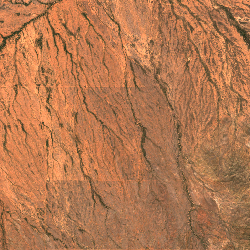
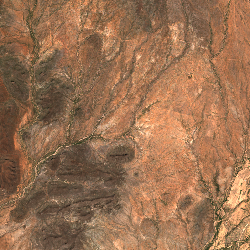
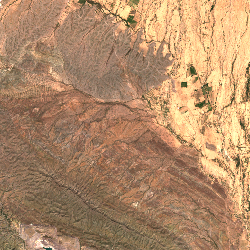
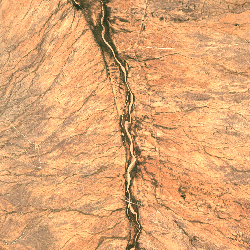
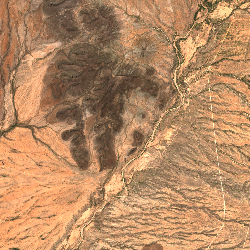

In [8]:
htmlDf = sedona.sql(f"""SELECT RS_AsImage(rast, 250) as FROM df_raster_input limit 5""")
SedonaUtils.display_image(htmlDf)

## <span style="color: #7b73e2;">Run Predictions and Visualize Results</span>

To run predictions, specify the model to use by the `model id`. Five models are pre-loaded and made available in **Wherobots Cloud**. You can also load your own models, learn more about that process [here](https://docs.wherobots.com/latest/tutorials/wherobotsai/wherobots-inference/raster-inference-overview/?h=bring#bring-your-own-model-guide).

Inference can be run using **Wherobots' Spatial SQL functions**, in this case: `RS_Text_to_BBoxes()`.
            
Here we generate predictions for all images in the ROI. The predictions output has one label for the text prompt, `1` for a positive prediction. 

Then filter and print some of the results to see how positive detect results look.   

In [9]:
model_id = 'owlv2'

predictions_df = sedona.sql(f"""
SELECT
  rast,
  detect_result.*
FROM (
  SELECT
    rast,
    RS_text_to_bboxes('{model_id}', rast, 'black solar panels', .2) AS detect_result
  FROM
    df_raster_input
) AS detect_fields
""")

predictions_df.cache().count()
predictions_df.filter(size(col("labels")) == 0).show(3)
predictions_df.filter(size(col("labels")) == 1).show(3)
predictions_df.createOrReplaceTempView("predictions")

+--------------------+----------+-----------------+------+
|                rast|bboxes_wkt|confidence_scores|labels|
+--------------------+----------+-----------------+------+
|OutDbGridCoverage...|        []|               []|    []|
|OutDbGridCoverage...|        []|               []|    []|
|OutDbGridCoverage...|        []|               []|    []|
+--------------------+----------+-----------------+------+
only showing top 3 rows

+--------------------+--------------------+-----------------+------+
|                rast|          bboxes_wkt|confidence_scores|labels|
+--------------------+--------------------+-----------------+------+
|OutDbGridCoverage...|[POLYGON ((-111.8...|     [0.23138665]|   [1]|
|OutDbGridCoverage...|[POLYGON ((-113.5...|      [0.5022141]|   [1]|
|OutDbGridCoverage...|[POLYGON ((-109.3...|     [0.22831577]|   [1]|
+--------------------+--------------------+-----------------+------+



## <span style="color: #7b73e2;">Run Predictions And Visualize Results</span>

Since we ran inference across a lot of satellite imagery, many scenes don't contain solar farms and therefore have positive detections. Now that we've generated predictions with confidence scores, we can filter the geometries by confidence score with `RS_FILTER_BOX_CONFIDENCE`.

In [10]:
filtered_predictions = sedona.sql(f"""
  SELECT
    rast,
    filtered.*
  FROM (
    SELECT
      rast,
      RS_FILTER_BOX_CONFIDENCE(bboxes_wkt, confidence_scores, labels, 0.00) AS filtered
    FROM
      predictions
  ) AS temp
    WHERE size(filtered.max_confidence_bboxes) > 0
    AND 
        array_contains(filtered.max_confidence_labels, '1')
""")
filtered_predictions.createOrReplaceTempView("filtered_predictions")
print(filtered_predictions.cache().count())

3


## <span style="color: #7b73e2;">Prepare Results</span>

Before plotting our predictions we need to transfrom our results. 

We need our table in a structure where each row represents _all_ of a raster scene's bounding box predictions to a format where each row represents a _single_ predicted bounding box. 

To do this, combine the list columns containing our prediction results (`max_confidence_bboxes`, `max_confidence_scores`, and `max_confidence_labels`) with `arrays_zip`.  Then use `explode` to convert lists to rows. 

To map the results with `SedonaKepler`, convert the `max_confidence_bboxes` column to a `GeometryType` column with `ST_GeomFromWKT`

In [11]:
exploded_df = sedona.sql("""
SELECT
    rast,
    exploded.*
FROM (
    SELECT
        rast,
        explode(arrays_zip(max_confidence_bboxes, max_confidence_scores, max_confidence_labels)) AS exploded
    FROM
        filtered_predictions
) temp
""")
df_exploded = exploded_df.withColumn("geometry", expr("ST_GeomFromWkt(max_confidence_bboxes)")).drop("max_confidence_bboxes")
print(df_exploded.cache().count())
df_exploded.show()

3
+--------------------+---------------------+---------------------+--------------------+
|                rast|max_confidence_scores|max_confidence_labels|            geometry|
+--------------------+---------------------+---------------------+--------------------+
|OutDbGridCoverage...|           0.23138665|                    1|POLYGON ((-111.86...|
|OutDbGridCoverage...|            0.5022141|                    1|POLYGON ((-113.51...|
|OutDbGridCoverage...|           0.22831577|                    1|POLYGON ((-109.32...|
+--------------------+---------------------+---------------------+--------------------+



## <span style="color: #7b73e2;">Select a Footprint and Review the Image</span>


Select one of the detected **footprints** from the map above. Copy the name of a detected bounding box and paste it into the query below to retrieve the corresponding image.


<span style="color: #7b73e2;">**Remember:**</span>  If you changed the ROI at the begining the `image_name` below might not be found.

In [12]:
from sedona.maps.SedonaKepler import SedonaKepler

kepler_map = SedonaKepler.create_map()

SedonaKepler.add_df(kepler_map, df=df_exploded.drop("rast"), name="Solar Panel Detections")
kepler_map

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl(data={'Solar Panel Detections': {'index': [0, 1, 2], 'columns': ['max_confidence_scores', 'max_confid…

In [15]:
df_exploded.createOrReplaceTempView("exploded_predictions")

,"rs_asimage(rast, 500)"
0,
1,
2,

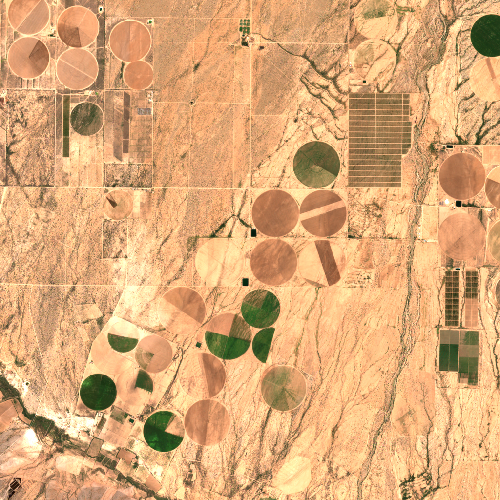
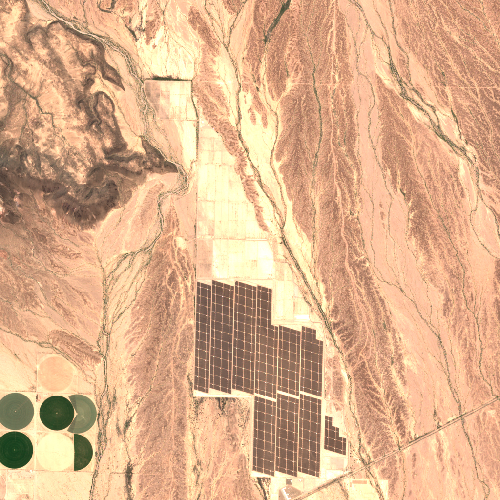
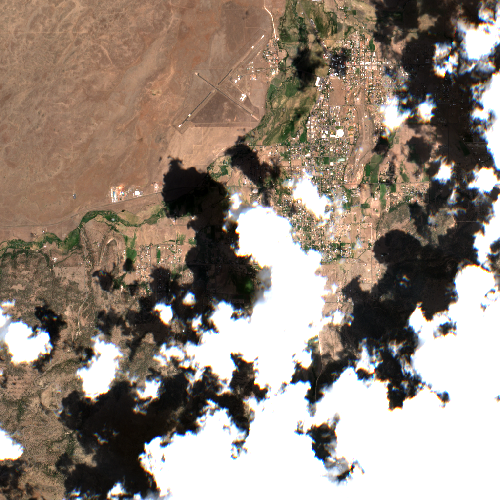

In [16]:
htmlDf = sedona.sql(f"""SELECT RS_AsImage(rast, 500) FROM exploded_predictions""")
SedonaUtils.display_image(htmlDf)

In [17]:
pandas_df = filtered_predictions.toPandas()

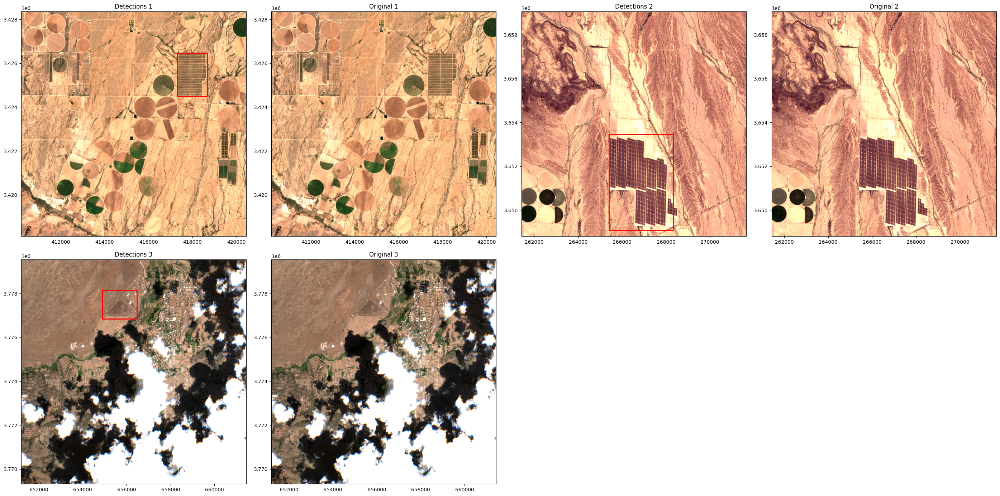

In [28]:
outdb_rasters = show_detections(
    pandas_df,
    confidence_threshold=0.18,
    plot_geoms=True,
    side_by_side=True,
)

Running Segment Anything on text prompts on the same imagery we used for OWLv2

In [29]:
model_id = 'sam2'

sam_predictions_df = sedona.sql(f"""
SELECT
  rast,
  segment_result.*
FROM (
  SELECT
    rast,
    RS_Text_to_Segments('{model_id}', rast, 'black solar panels', 0.2) AS segment_result
  FROM
    filtered_predictions
) AS segment_fields
""")

In [30]:
inference_results = sam_predictions_df.toPandas()

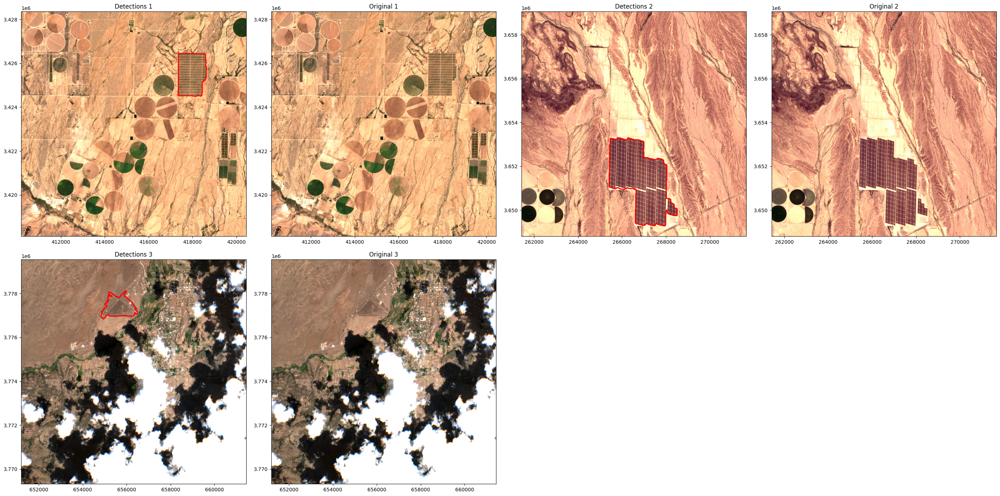

In [31]:
outdb_rasters = show_detections(
    inference_results,
    confidence_threshold=0.10,
    plot_geoms=True,
    side_by_side=True,
)

Running OWLv2 on Satellogic 1 meter imagery GeoTiffs

In [32]:
from pyspark.sql.functions import expr
import warnings
warnings.filterwarnings('ignore')

from sedona.spark import SedonaContext
from pyspark.sql.functions import expr
from wherobots.inference.engine.register import create_object_detection_udfs
from wherobots.inference.plot.detections import *

config = (SedonaContext.builder().appName('object-detection-batch-inference')\
    .config("spark.hadoop.fs.s3a.bucket.satellogic-earthview.aws.credentials.provider", "org.apache.hadoop.fs.s3a.AnonymousAWSCredentialsProvider")
    .getOrCreate())

sedona = SedonaContext.create(config)

_, _, rs_detect_owl = create_object_detection_udfs(
    batch_size=5, sedona=sedona
)

# files = [
#     "s3://wbc-test-data-staging/tests/data/detection/offshore-wind-positive-detection.tif",
#     "s3://wbc-test-data-staging/tests/data/detection/offshore-wind-no-detection.tif",
# ]
files = ["https://satellogic-earthview.s3.us-west-2.amazonaws.com/data/tif/zone=36N/region=361327_5813168/date=2022-07-01/20220701_085711_SN18_36N_361327_5813168_VISUAL.tif",
         "https://satellogic-earthview.s3.us-west-2.amazonaws.com/data/tif/zone=36N/region=361327_5811248/date=2022-07-01/20220701_085711_SN18_36N_361327_5811248_VISUAL.tif",
         "https://satellogic-earthview.s3.us-west-2.amazonaws.com/data/tif/zone=36N/region=362095_5816624/date=2022-07-01/20220701_085711_SN18_36N_362095_5816624_VISUAL.tif",
         "https://satellogic-earthview.s3.us-west-2.amazonaws.com/data/tif/zone=36N/region=362095_5819312/date=2022-07-01/20220701_085711_SN18_36N_362095_5819312_VISUAL.tif"]
if files[0].startswith("https"):
    files = [https_to_s3(u) for u in files]
files_df = sedona.createDataFrame(files, "string").toDF("path")
df_raster_input = files_df.withColumn(
    "outdb_raster", expr("RS_FromPath(path)")
).repartition(1)
model_id = "owlv2"

df_raster_input.createOrReplaceTempView("df_raster_input")

df = sedona.sql(f"""
    SELECT
    outdb_raster,
    detect_result.*
    FROM (
    SELECT
        outdb_raster,
        RS_TEXT_TO_BBOXES('{model_id}', outdb_raster, 'indivdual small buildings', 0.1) AS detect_result
    FROM
        df_raster_input
    ) AS detect_fields
""")

25/03/26 23:12:02 WARN SparkSession: Using an existing Spark session; only runtime SQL configurations will take effect.
25/03/26 23:12:03 WARN UDTRegistration: Cannot register UDT for org.geotools.coverage.grid.GridCoverage2D, which is already registered.
25/03/26 23:12:03 WARN SimpleFunctionRegistry: The function rs_union_aggr replaced a previously registered function.
25/03/26 23:12:03 WARN UDTRegistration: Cannot register UDT for org.locationtech.jts.geom.Geometry, which is already registered.
25/03/26 23:12:03 WARN UDTRegistration: Cannot register UDT for org.apache.sedona.common.geometryObjects.Geography, which is already registered.
25/03/26 23:12:03 WARN UDTRegistration: Cannot register UDT for org.locationtech.jts.index.SpatialIndex, which is already registered.
25/03/26 23:12:03 WARN SimpleFunctionRegistry: The function st_union_aggr replaced a previously registered function.
25/03/26 23:12:03 WARN SimpleFunctionRegistry: The function st_envelope_aggr replaced a previously reg

KeyboardInterrupt: 

25/03/26 23:12:08 WARN SimpleFunctionRegistry: The function rs_classify replaced a previously registered function.
25/03/26 23:12:08 WARN SimpleFunctionRegistry: The function rs_max_confidence replaced a previously registered function.
25/03/26 23:12:08 WARN SimpleFunctionRegistry: The function rs_segment replaced a previously registered function.
25/03/26 23:12:08 WARN SimpleFunctionRegistry: The function rs_text_to_segments replaced a previously registered function.
25/03/26 23:12:08 WARN SimpleFunctionRegistry: The function rs_detect_bboxes replaced a previously registered function.
25/03/26 23:12:08 WARN SimpleFunctionRegistry: The function rs_filter_box_confidence replaced a previously registered function.
25/03/26 23:12:08 WARN SimpleFunctionRegistry: The function rs_text_to_bboxes replaced a previously registered function.


In [ ]:
pandas_df = df.toPandas()

In [ ]:
load_image(pandas_df.iloc[0][0].path)

In [ ]:
outdb_rasters = show_detections(
    pandas_df,
    confidence_threshold=0.18,
    plot_geoms=True,
    side_by_side=True,
)

In [ ]:
# my_map = show_interactive_detections(df)
# my_map

# Testing SAM2 on Solar farms

In [ ]:
from wherobots.inference.data.io import read_raster_table

tif_folder_path = 's3a://wherobots-benchmark-prod/data/ml/satlas/'
files_df = read_raster_table(tif_folder_path, sedona, limit=100)
df_raster_input = files_df.withColumn(
        "outdb_raster", expr("RS_FromPath(path)")
    )

df_raster_input.cache().count()
df_raster_input.createOrReplaceTempView("df_raster_input")

In [ ]:
model_id = 'sam2'

predictions_df = sedona.sql(f"""
SELECT
  outdb_raster,
  segment_result.*
FROM (
  SELECT
    outdb_raster,
    RS_Text_to_SEGMENTS('{model_id}', outdb_raster, 'solar panels', 0.3) AS segment_result
  FROM
    df_raster_input
) AS segment_fields
""")

In [ ]:
inference_results = predictions_df.toPandas()

In [ ]:
outdb_rasters = show_detections(
    inference_results,
    confidence_threshold=0.10,
    plot_geoms=True,
    side_by_side=True,
)